## 8장. 영상 매칭과 추적

### 특징 매칭 : 사진에서 비슷한 특징을 가진 애들끼리 짝지어주는 매칭 방법

### 배경 제거 : 사진에서 객체를 인식한 후 배경을 제거하는 방법

### 특징 매칭

특징 매칭은 서로 다른 두 영상에서 구한 특징점과 특징 디스크립터들을 각각 비교하여 그 거리가 비슷한 것끼리 짝짓는 것을 말한다. 짝지어진 특징점들 중에 거리가 유의미한 것들을 모아 대칭점으로 표시하면 그 개수에 따라 두 영상이 얼마나 비슷한지 측정 가능하고 비슷한 영역을 찾아낼 수도 있다.

#### 특징 매칭 인터페이스

여러 알고리즘을 통일된 인터페이스로 제공하기 위해 특징 매칭 알고리즘을 추상 클래스인 cv2.DescriptorMatcher()로 상속받아 구현한다.

#### BFMacher

Burte-Force Matching은 queryDescriptor와 trainDescriptor를 일일이 전수조사해 매칭하는 알고리즘으로 cv2.BFMatcher() 함수를 제공한다.

- cv2.BFMatcher_create() : 클래스에서 객체 생성 함수

거리 측정의 경우 유클리드 거리, 해밍 거리 중 선택 가능하다. 앞서 배운 SIFT, SURF로 추출한 디스크립터의 경우 NORM_L1, NORM_L2가 적합하고, ORB는 NORM_HAMMING이 적당하다.

match_bf_sift.py

In [4]:
import cv2, numpy as np

img1 = cv2.imread('../img/cube.jpg')
img2 = cv2.imread('../img/figures.jpg')
print(img1.shape)
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# SIFT 서술자 추출기 생성 ---①
detector = cv2.xfeatures2d.SIFT_create()
# 각 영상에 대해 키 포인트와 서술자 추출 ---②
kp1, desc1 = detector.detectAndCompute(gray1, None)
kp2, desc2 = detector.detectAndCompute(gray2, None)

# BFMatcher 생성, L1 거리, 상호 체크 ---③
matcher = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
# 매칭 계산 ---④
matches = matcher.match(desc1, desc2)
# 매칭 결과 그리기 ---⑤
res = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, \
                      flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
# 결과 출력 
cv2.imshow('BFMatcher + SIFT', res)
cv2.waitKey()
cv2.destroyAllWindows()

(740, 756, 3)


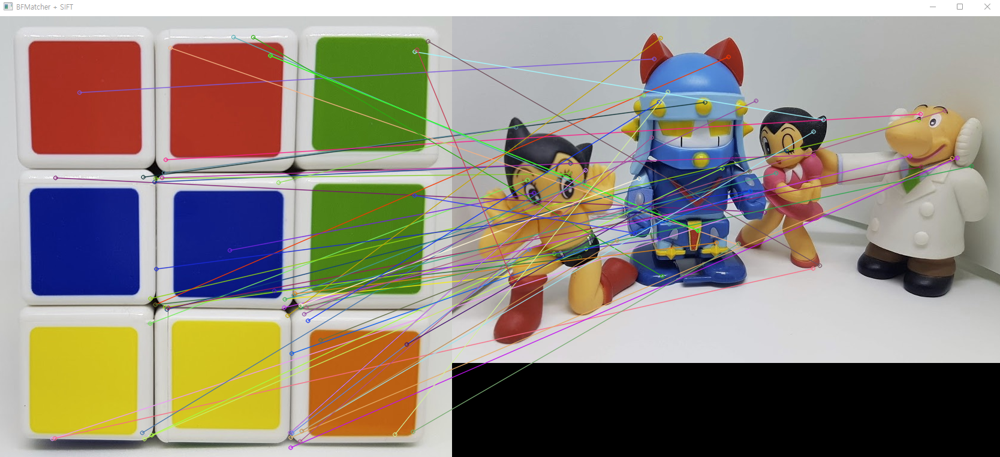

match_bf_surf.py

In [5]:
import cv2
import numpy as np

img1 = cv2.imread('../img/cube.jpg')
img2 = cv2.imread('../img/figures.jpg')
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# SURF 서술자 추출기 생성 ---①
detector = cv2.xfeatures2d.SURF_create()
kp1, desc1 = detector.detectAndCompute(gray1, None)
kp2, desc2 = detector.detectAndCompute(gray2, None)

# BFMatcher 생성, L2 거리, 상호 체크 ---③
matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
# 매칭 계산 ---④
matches = matcher.match(desc1, desc2)
# 매칭 결과 그리기 ---⑤
res = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, \
                     flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

cv2.imshow('BF + SURF', res)
cv2.waitKey()
cv2.destroyAllWindows()

error: OpenCV(4.5.2) C:\Users\runneradmin\AppData\Local\Temp\pip-req-build-k1ohfcms\opencv_contrib\modules\xfeatures2d\src\surf.cpp:1029: error: (-213:The function/feature is not implemented) This algorithm is patented and is excluded in this configuration; Set OPENCV_ENABLE_NONFREE CMake option and rebuild the library in function 'cv::xfeatures2d::SURF::create'


-> 버전 오류 계속 뜸 다른 버전이어서 그럼

match_bf_orb.py

In [6]:
import cv2, numpy as np

img1 = cv2.imread('../img/cube.jpg')
img2 = cv2.imread('../img/figures.jpg')
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# SIFT 서술자 추출기 생성 ---①
detector = cv2.ORB_create()
# 각 영상에 대해 키 포인트와 서술자 추출 ---②
kp1, desc1 = detector.detectAndCompute(gray1, None)
kp2, desc2 = detector.detectAndCompute(gray2, None)

# BFMatcher 생성, Hamming 거리, 상호 체크 ---③
matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
# 매칭 계산 ---④
matches = matcher.match(desc1, desc2)
# 매칭 결과 그리기 ---⑤
res = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, \
                     flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

cv2.imshow('BFMatcher + ORB', res)
cv2.waitKey()
cv2.destroyAllWindows()

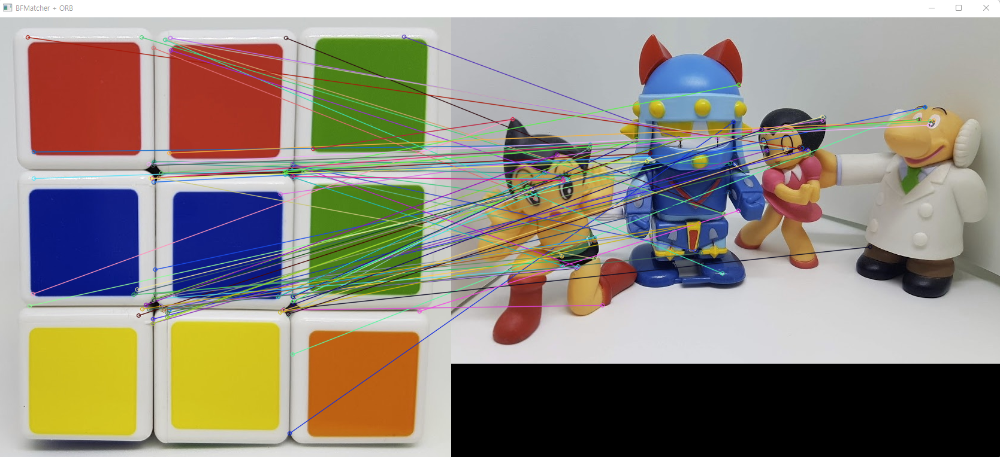

#### FLANN(Fast Library for Approximate Nearest Neighbors Matching)

BFMatcher는 모든 디스크립터를 전수 조사하기 떄문에 이미지 사이즈가 큰 경우 속도가 느려진다. FLANN은 모든 특징 디스크립터를 조사한다기 보다 가장 가까운 근사 값으로 매칭을 한다. 이웃을 찾기 위해 다양한 알고리즘이 포함되어 있는데, 알고리즘을 선택하기 위해 인덱스 파라미터와 검색 파라미터를 전달해야 한다.

- cv2.FlannBasedMatcher() 함수

match_flann.py

In [8]:
import cv2, numpy as np

img1 = cv2.imread('../img/CUBE.jpg')
img2 = cv2.imread('../img/figures.jpg')
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# SIFT 생성
detector = cv2.xfeatures2d.SIFT_create()
# 키 포인트와 서술자 추출
kp1, desc1 = detector.detectAndCompute(gray1, None)
kp2, desc2 = detector.detectAndCompute(gray2, None)

# 인덱스 파라미터와 검색 파라미터 설정
FLANN_INDEX_KDTREE = 1 # SIFT나 SURF를 사용할 때 주는 인자
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

# Flann 매처 생성 ---③
matcher = cv2.FlannBasedMatcher(index_params, search_params)
# 매칭 계산 ---④
matches = matcher.match(desc1, desc2)
# 매칭 그리기
res = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, \
                flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

cv2.imshow('Flann + SIFT', res)
cv2.waitKey()
cv2.destroyAllWindows()

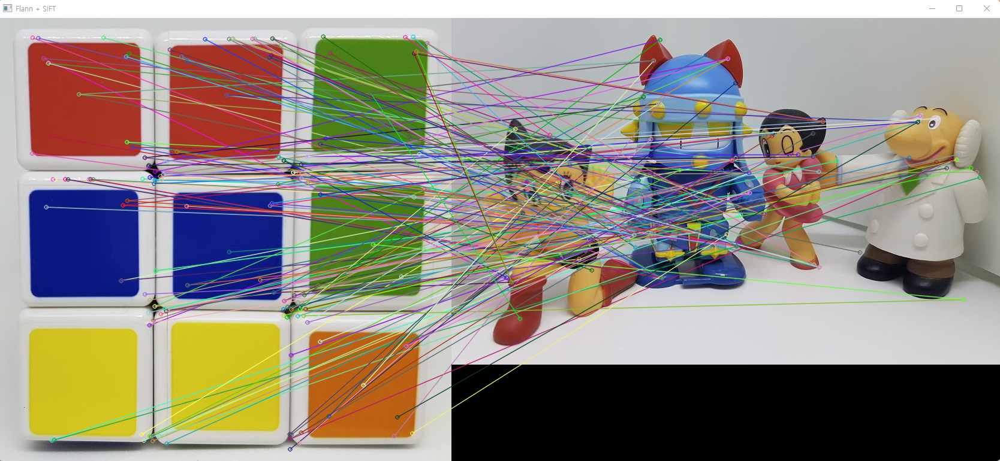

match_flann_orb.py

In [9]:
import cv2, numpy as np

img1 = cv2.imread('../img/cube.jpg')
img2 = cv2.imread('../img/figures.jpg')
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# ORB 추출기 생성
detector = cv2.ORB_create()
# 키 포인트와 서술자 추출
kp1, desc1 = detector.detectAndCompute(gray1, None)
kp2, desc2 = detector.detectAndCompute(gray2, None)

# 인덱스 파라미터 설정 
FLANN_INDEX_LSH = 6
index_params= dict(algorithm = FLANN_INDEX_LSH,
                   table_number = 6,
                   key_size = 12,
                   multi_probe_level = 1)
# 검색 파라미터 설정 
search_params=dict(checks=32)
# Flann 매처 생성 
matcher = cv2.FlannBasedMatcher(index_params, search_params)
# 매칭 계산 
matches = matcher.match(desc1, desc2)
# 매칭 그리기
res = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, \
            flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
# 결과 출력            
cv2.imshow('Flann + ORB', res)
cv2.waitKey()
cv2.destroyAllWindows()

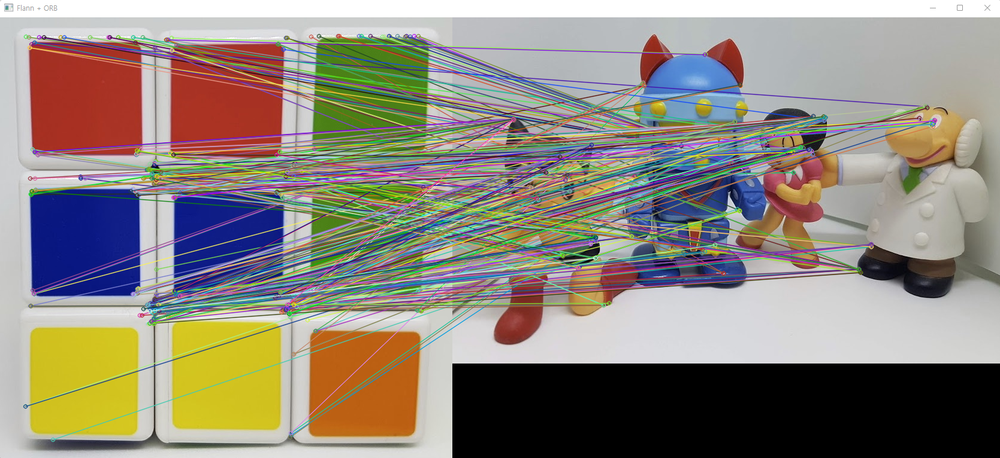

#### 좋은 매칭점 찾기

앞서 살펴본 매칭 결과는 너무 많은 정보를 포함한다. 따라서 매칭 결과에서 쓸모 없는 매칭점은 버리고 좋은 매칭점만 골라내는 작업이 필요하다.

matching_good.py

In [10]:
import cv2, numpy as np

img1 = cv2.imread('../img/cube.jpg')
img2 = cv2.imread('../img/figures.jpg')
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# ORB로 서술자 추출 
detector = cv2.ORB_create()
kp1, desc1 = detector.detectAndCompute(gray1, None)
kp2, desc2 = detector.detectAndCompute(gray2, None)
# BF-Hamming으로 매칭 
matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = matcher.match(desc1, desc2)

# 매칭 결과를 거리기준 오름차순으로 정렬 
matches = sorted(matches, key=lambda x:x.distance)
# 최소 거리 값과 최대 거리 값 확보 
min_dist, max_dist = matches[0].distance, matches[-1].distance
# 최소 거리의 20% 지점을 임계점으로 설정 
ratio = 0.2
good_thresh = (max_dist - min_dist) * ratio + min_dist
# 임계점 보다 작은 매칭점만 좋은 매칭점으로 분류 
good_matches = [m for m in matches if m.distance < good_thresh]
print('matches:%d/%d, min:%.2f, max:%.2f, thresh:%.2f' \
        %(len(good_matches),len(matches), min_dist, max_dist, good_thresh))
# 좋은 매칭점만 그리기 
res = cv2.drawMatches(img1, kp1, img2, kp2, good_matches, None, \
                flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
# 결과 출력
cv2.imshow('Good Match', res)
cv2.waitKey()
cv2.destroyAllWindows()

matches:9/80, min:27.00, max:83.00, thresh:38.20


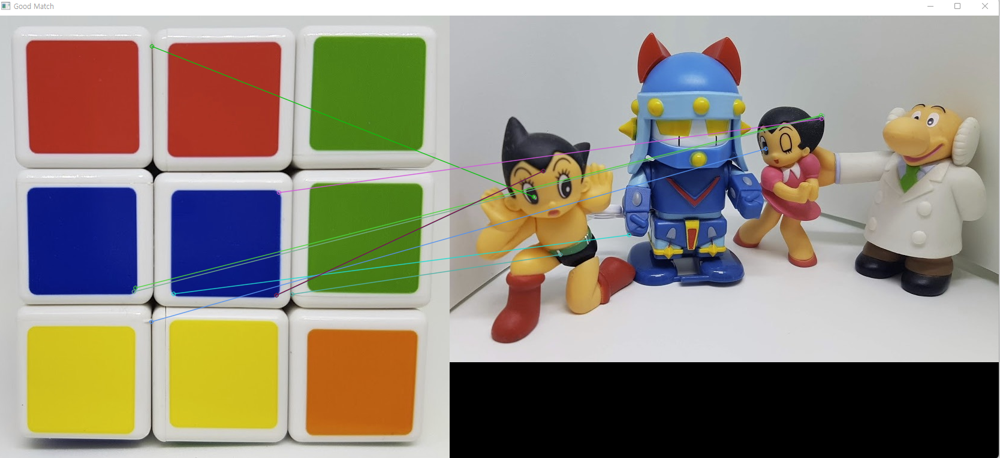

matching_good_knn.py

In [15]:
import cv2, numpy as np

img1 = cv2.imread('../img/cube.jpg')
img2 = cv2.imread('../img/figures.jpg')
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# ORB로 서술자 추출 ---①
detector = cv2.ORB_create()
kp1, desc1 = detector.detectAndCompute(gray1, None)
kp2, desc2 = detector.detectAndCompute(gray2, None)
# BF-Hamming 생성 ---②
matcher = cv2.BFMatcher(cv2.NORM_HAMMING2)
# knnMatch, k=2 
matches = matcher.knnMatch(desc1, desc2, 2)

# 첫번재 이웃의 거리가 두 번째 이웃 거리의 75% 이내인 것만 추출---⑤
ratio = 0.75
good_matches = [first for first,second in matches \
                    if first.distance < second.distance * ratio]
print('matches:%d/%d' %(len(good_matches),len(matches)))

# 좋은 매칭만 그리기
res = cv2.drawMatches(img1, kp1, img2, kp2, good_matches, None, \
                    flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
# 결과 출력                    
cv2.imshow('Matching', res)
cv2.waitKey()
cv2.destroyAllWindows()

matches:2/500


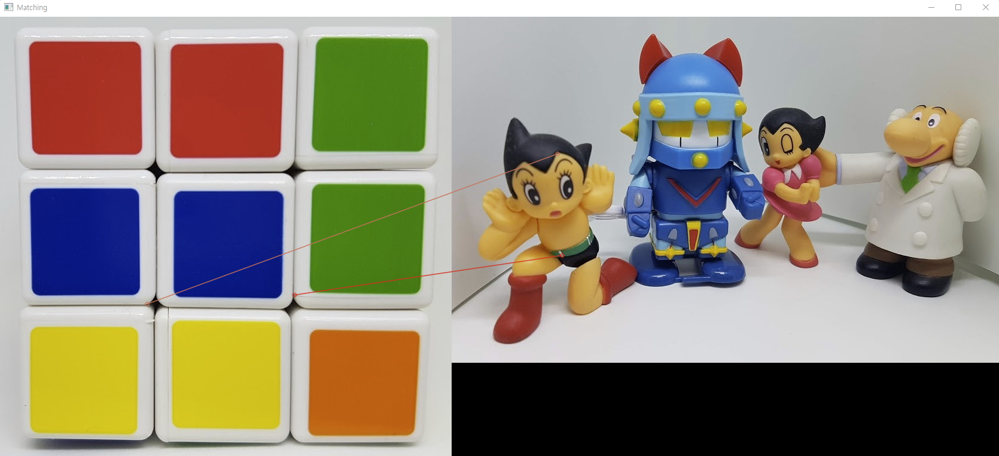

### 객체 추적

동영상에서 지속적으로 움직이는 객체를 찾는 방법을 객체 추적이라고 한다.

#### 배경 제거

객체 추적을 위하여 객체가 무엇인지, 어디 있는지부터 명확하게 파악해야 한다. 객체를 명확히 파악하기 위한 방법 중 하나로 배경 제거가 있다. 객체를 포함하는 영상에서 객체가 없는 배경 영상을 빼는 방법을 의미한다.

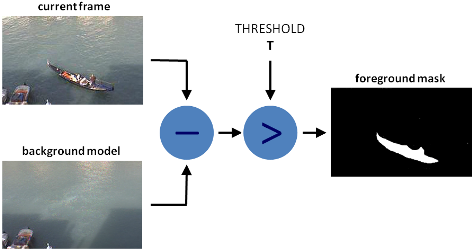

- cv2.bgsegm.createBackgroundSubtractorMOG() 함수

track_bgsub_mog.py

In [16]:
import numpy as np, cv2

cap = cv2.VideoCapture('../img/walking.avi')
fps = cap.get(cv2.CAP_PROP_FPS) # 프레임 수 구하기
delay = int(1000/fps)
# 배경 제거 객체 생성 --- ①
fgbg = cv2.bgsegm.createBackgroundSubtractorMOG()
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    # 배경 제거 마스크 계산 --- ②
    fgmask = fgbg.apply(frame)
    cv2.imshow('frame',frame)
    cv2.imshow('bgsub',fgmask)
    if cv2.waitKey(1) & 0xff == 27:
        break
cap.release()
cv2.destroyAllWindows()

파라미터가 되게 많은데 default 값이 설정되어 있어 그걸 따르면 된다. 배경  제거 객체에 apply 함수를 적용하면 배경이 제거된 전경 마스크를 얻을 수 있다.

또 다른 배경 제거 함수는 다음과 같다.

- cv2.createBackgroundSubtractorMOG2()

track_bgsub_mog2.py

In [17]:
import numpy as np, cv2

cap = cv2.VideoCapture('../img/walking.avi')
fps = cap.get(cv2.CAP_PROP_FPS) # 프레임 수 구하기
delay = int(1000/fps)
# 배경 제거 객체 생성 
fgbg = cv2.createBackgroundSubtractorMOG2()
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    # 배경 제거 마스크 계산 
    fgmask = fgbg.apply(frame)
    cv2.imshow('frame',frame)
    cv2.imshow('bgsub',fgmask)
    if cv2.waitKey(delay) & 0xff == 27:
        break
cap.release()
cv2.destroyAllWindows()

#### 옵티컬 플로

옵티컬 플로(Optical Flow)는 이전 장면과 다음 장면 사이의 픽셀이 이동한 방향과 거리에 대한 분포이다. 
이것은 영상 속 물체가 어느 방향으로 움직였는지에 대해 알 수 있다.

- 일부 픽셀만을 계산하는 희소 옵티컬 플로
- 영상 전체 픽셀을 모두 계산하는 밀집 옵티컬 플로

- cv2.calcOpticalFlowFarneback() 함수 : 희소 옵티컬 플로

In [27]:
import numpy as np, cv2

cap = cv2.VideoCapture('../img/walking.avi')
fps = cap.get(cv2.CAP_PROP_FPS) # 프레임 수 구하기
delay = int(1000/fps)
# 추적 경로를 그리기 위한 랜덤 색상
color = np.random.randint(0,255,(200,3))
lines = None  #추적 선을 그릴 이미지 저장 변수
prevImg = None  # 이전 프레임 저장 변수
# calcOpticalFlowPyrLK 중지 요건 설정
termcriteria =  (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03)

while cap.isOpened():
    ret,frame = cap.read()
    if not ret:
        break
    img_draw = frame.copy()
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    # 최초 프레임 경우
    if prevImg is None:
        prevImg = gray
        # 추적선 그릴 이미지를 프레임 크기에 맞게 생성
        lines = np.zeros_like(frame)
        # 추적 시작을 위한 코너 검출
        prevPt = cv2.goodFeaturesToTrack(prevImg, 200, 0.01, 10)
    else:
        nextImg = gray
        # 옵티컬 플로우로 다음 프레임의 코너점  찾기
        nextPt, status, err = cv2.calcOpticalFlowPyrLK(prevImg, nextImg, \
                                        prevPt, None, criteria=termcriteria)
        # 대응점이 있는 코너, 움직인 코너 선별 
        prevMv = prevPt[status==1]
        nextMv = nextPt[status==1]
        for i,(p, n) in enumerate(zip(prevMv, nextMv)):
            px,py = p.ravel()
            nx,ny = n.ravel()
            # 이전 코너와 새로운 코너에 선그리기
            cv2.line(lines, (px, py), (nx,ny), color[i].tolist(), 2)
            # 새로운 코너에 점 그리기
            cv2.circle(img_draw, (nx,ny), 2, color[i].tolist(), -1)
        # 누적된 추적 선을 출력 이미지에 합성 
        img_draw = cv2.add(img_draw, lines)
        # 다음 프레임을 위한 프레임과 코너점 이월
        prevImg = nextImg
        prevPt = nextMv.reshape(-1,1,2)

    cv2.imshow('OpticalFlow-LK', img_draw)
    key = cv2.waitKey(delay)
    if key == 27 : # Esc:종료
        break
    elif key == 8: # Backspace:추적 이력 지우기
        prevImg = None
cv2.destroyAllWindows()
cap.release()

error: OpenCV(4.5.2) :-1: error: (-5:Bad argument) in function 'line'
> Overload resolution failed:
>  - Can't parse 'pt1'. Sequence item with index 0 has a wrong type
>  - Can't parse 'pt1'. Sequence item with index 0 has a wrong type


밀집 옵티컬 플로는 영상 전체의 픽셀로 계산하기 때문에 추적할 특징점을 따로 전달할 필요가 없지만 속도가 느리다는 단점이 있다.

- cv2.calcOpticalFlowFarneback()

track_optical_farneback.py

In [8]:
import cv2, numpy as np

# 플로우 결과 그리기 
def drawFlow(img,flow,step=16):
    h,w = img.shape[:2]
    # 16픽셀 간격의 그리드 인덱스 구하기 
    idx_y,idx_x = np.mgrid[step/2:h:step,step/2:w:step].astype(np.int)
    indices =  np.stack( (idx_x,idx_y), axis =-1).reshape(-1,2)
  
    for x,y in indices:   # 인덱스 순회
        # 각 그리드 인덱스 위치에 점 그리기 
        cv2.circle(img, (x,y), 1, (0,255,0), -1)
        # 각 그리드 인덱스에 해당하는 플로우 결과 값 (이동 거리)  
        dx,dy = flow[y, x].astype(np.int)
        # 각 그리드 인덱스 위치에서 이동한 거리 만큼 선 그리기 
        cv2.line(img, (x,y), (x+dx, y+dy), (0,255, 0),2, cv2.LINE_AA )


prev = None # 이전 프레임 저장 변수

cap = cv2.VideoCapture('../img/walking.avi')
fps = cap.get(cv2.CAP_PROP_FPS) # 프레임 수 구하기
delay = int(1000/fps)

while cap.isOpened():
    ret,frame = cap.read()
    if not ret: break
    gray = cv2.cvtColor(frame,cv2.COLOR_BGR2GRAY)
    # 최초 프레임 경우 
    if prev is None: 
        prev = gray # 첫 이전 프레임 
    else:
        # 이전, 이후 프레임으로 옵티컬 플로우 계산 
        flow = cv2.calcOpticalFlowFarneback(prev,gray,None,\
                0.5,3,15,3,5,1.1,cv2.OPTFLOW_FARNEBACK_GAUSSIAN) 
    # 계산 결과 그리기, 선언한 함수 호출 
        drawFlow(frame,flow)
    # 다음 프레임을 위해 이월 
        prev = gray
  
    cv2.imshow('OpticalFlow-Farneback', frame)
    if cv2.waitKey(delay) == 27:
        break
cap.release()
cv2.destroyAllWindows()

#### MeanShift 추적

대상 객체의 색상 정보로 추적하는 방법.

1. 추적 대상을 선정하여 HSV 컬러 스페이스의 H 값 히스토그램 계산
2. 전체 영샹의 히스토그램 계산 결과로 역투영
3. 역투영 결과에서 이동한 객체를 MeanShift로 추적

-cv2.meanShift() : 평균 이동으로 대상 객체의 위치를 찾아주는 함수

track_meanshift_cam.py

In [9]:
import numpy as np, cv2

roi_hist = None     # 추적 객체 히스토그램 저장 변수
win_name = 'MeanShift Tracking'
termination =  (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 1)

cap = cv2.VideoCapture(0)
cap.set(cv2.CAP_PROP_FRAME_WIDTH, 640)
cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 480)
while cap.isOpened():
    ret, frame = cap.read()    
    img_draw = frame.copy()
    
    if roi_hist is not None:  # 추적 대상 객체 히스토그램 등록 됨
        # 전체 영상 hsv 컬로 변환 
        hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
        # 전체 영상 히스토그램과 roi 히스트그램 역투영 
        dst = cv2.calcBackProject([hsv], [0], roi_hist, [0,180], 1)
        # 역 투영 결과와 초기 추적 위치로 평균 이동 추적 
        ret, (x,y,w,h) = cv2.meanShift(dst, (x,y,w,h), termination)
        # 새로운 위치에 사각형 표시 
        cv2.rectangle(img_draw, (x,y), (x+w, y+h), (0,255,0), 2)
        # 컬러 영상과 역투영 영상을 통합해서 출력
        result = np.hstack((img_draw, cv2.cvtColor(dst, cv2.COLOR_GRAY2BGR)))
    else:  # 추적 대상 객체 히스토그램 등록 안됨
        cv2.putText(img_draw, "Hit the Space to set target to track", \
                 (10,30),cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255), 1, cv2.LINE_AA)
        result = img_draw

    cv2.imshow(win_name, result)
    key = cv2.waitKey(1) & 0xff
    if  key == 27: # Esc
        break
    elif key == ord(' '): # 스페이스-바, ROI 설정
        x,y,w,h = cv2.selectROI(win_name, frame, False)
        if w and h :    # ROI가 제대로 설정됨
            # 초기 추적 대상 위치로 roi 설정 
            roi = frame[y:y+h, x:x+w]
            # roi를 HSV 컬러로 변경
            roi = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)
            mask = None
            # roi에 대한 히스토그램 계산 
            roi_hist = cv2.calcHist([roi], [0], mask, [180], [0,180])
            cv2.normalize(roi_hist, roi_hist, 0, 255, cv2.NORM_MINMAX)
        else:                       # ROI 설정 안됨
            roi_hist = None
else:
    print('no camera!')
cap.release()
cv2.destroyAllWindows()